In [1]:
import pandas as pd

data11 = pd.read_csv('../data/cian_sochi_all1-57_lat.csv')
data12 = pd.read_csv('../data/cian_sochi_all58-100_lat.csv')
data2 = pd.read_csv('../data/sochi_real_estate_full.csv')

data11['date'] = '2025-03-09'
data12['date'] = '2025-03-29'

data1 = pd.concat([data11, data12], ignore_index=True).drop_duplicates(subset=['url'])

data2 = data2.rename(columns={
    'geo_lat': 'latitude',
    'geo_lon': 'longitude',
    'level': 'floor',
    'levels': 'floors_count',
    'rooms': 'rooms_count',
    'area': 'total_meters'
})

common_cols = list(set(data1.columns) & set(data2.columns))
combined = pd.concat([data1[common_cols], data2[common_cols]], ignore_index=True)

combined['price'] = pd.to_numeric(combined['price'], errors='coerce')

combined['total_meters'] = pd.to_numeric(combined['total_meters'], errors='coerce')
combined['latitude'] = pd.to_numeric(combined['latitude'], errors='coerce')
combined['longitude'] = pd.to_numeric(combined['longitude'], errors='coerce')
combined = combined.dropna().drop_duplicates(subset=['latitude', 'longitude', 'date'])

combined['price_per_sqm'] = combined['price'] / combined['total_meters']

# Защита от шутников
min_price = 1000.0

# Не достойны нашего бесплатного анализа, люди способные за него заплатить!
max_price = 10000000.0

# Защита от шутников
min_livespace = 10.0
combined = combined[(combined['price_per_sqm'] > min_price) & (combined['price_per_sqm'] < max_price)]
combined = combined[combined['total_meters'] > min_livespace]

In [2]:
combined

,price,longitude,floor,floors_count,date,latitude,rooms_count,total_meters,price_per_sqm
0,55000000,39.779436,14.0,23.0,2025-03-09,43.549919,3.0,96.0,572916.666667
1,4200000,39.599281,1.0,3.0,2025-03-09,43.683146,2.0,42.0,100000.000000
3,60000000,39.736810,24.0,24.0,2025-03-09,43.569320,2.0,66.7,899550.224888
4,3700000,39.338582,5.0,5.0,2025-03-09,43.913507,1.0,22.0,168181.818182
5,42136200,39.693735,2.0,4.0,2025-03-09,43.631473,2.0,45.9,918000.000000
...,...,...,...,...,...,...,...,...,...
70213,6000000,39.744395,2.0,8.0,2021-05-01,43.620976,2.0,54.0,111111.111111
70214,2000000,39.924426,2.0,2.0,2021-05-01,43.451773,-1.0,25.0,80000.000000
70215,8247500,39.739448,1.0,6.0,2021-05-01,43.574261,1.0,17.0,485147.058824
70216,5500000,39.716048,2.0,6.0,2021-05-01,43.616540,1.0,35.0,157142.857143


In [3]:
import overpy
import os

if not os.path.exists('../data/critical_pois.csv'):
    bbox = [43.0, 39.0, 44.0, 40.5]
    
    query = f"""
    [out:json][timeout:25];
    (
      node["tourism"]({','.join(map(str, bbox))});
      way["tourism"]({','.join(map(str, bbox))});
      relation["tourism"]({','.join(map(str, bbox))});
      
      node["amenity"]({','.join(map(str, bbox))});
      way["amenity"]({','.join(map(str, bbox))});
      relation["amenity"]({','.join(map(str, bbox))});
      
      node["leisure"]({','.join(map(str, bbox))});
      way["leisure"]({','.join(map(str, bbox))});
      relation["leisure"]({','.join(map(str, bbox))});
      
      node["historic"]({','.join(map(str, bbox))});
      way["historic"]({','.join(map(str, bbox))});
      relation["historic"]({','.join(map(str, bbox))});
      
      node["aeroway"]({','.join(map(str, bbox))});
      way["aeroway"]({','.join(map(str, bbox))});
      relation["aeroway"]({','.join(map(str, bbox))});
    );
    out center;
    >;
    out skel qt;
    """
    
    api = overpy.Overpass()
    result = api.query(query)
    
    pois = []
    for element in result.nodes + result.ways + result.relations:
        tags = element.tags
        if 'name' in tags:
            if isinstance(element, overpy.Node):
                lat, lon = element.lat, element.lon
            else:
                lat, lon = element.center_lat, element.center_lon
            
            pois.append({
                'name': tags['name'],
                'type': type(element).__name__,
                'lat': float(lat),
                'lon': float(lon),
                **tags
            })
    
    pois_df = pd.DataFrame(pois)

    critical_pois = pois_df[
        pois_df.apply(
            lambda row: (
                (row.get('aeroway') == 'aerodrome') 
                or (row.get('leisure') == 'park')
                or (row.get('railway') == 'station')
                or (row.get('amenity') in ['train_station', 'bus_station'])
            ),
            axis=1
        )
    ]
    critical_pois.to_csv('../data/critical_pois.csv')
else:
    critical_pois = pd.read_csv('../data/critical_pois.csv')

## Считаем расстояния до каждого из интересных мест (требует времени)

In [6]:
from tqdm import tqdm
import numpy as np

def haversine(lat1, lon1, lat2, lon2):
    R = 6371
    phi1, phi2 = np.radians(lat1), np.radians(lat2)
    dphi = np.radians(lat2 - lat1)
    dlambda = np.radians(lon2 - lon1)
    a = np.sin(dphi / 2) ** 2 + np.cos(phi1) * np.cos(phi2) * np.sin(dlambda / 2) ** 2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    return R * c

combined_coords = combined[['latitude', 'longitude']].values

for _, poi in tqdm(critical_pois.iterrows(), total=len(critical_pois)):
    poi_name = poi['name'].replace(" ", "_").lower()
    poi_lat, poi_lon = poi['lat'], poi['lon']
    
    distances = [
        haversine(lat, lon, poi_lat, poi_lon) if not np.isnan(lat) else None
        for lat, lon in combined_coords
    ]
    
    combined[f'distance_to_{poi_name}_km'] = distances

100%|█████████████████████████████████████████████████████████████████████████████████████| 98/98 [00:55<00:00,  1.77it/s]


In [7]:
mortgage = pd.read_csv('../data/CBR_mortgage_data.csv')

mortgage['Yearly rate (%)'] = mortgage['Yearly rate (%)'].str.replace(',', '.').astype(float)
mortgage['New mortgages'] = mortgage['New mortgages'].str.replace(' ', '').astype(int)
mortgage['New mortgage amount (millions)'] = mortgage['New mortgage amount (millions)'].str.replace(' ', '').astype(float)

mortgage['date'] = pd.to_datetime(
    mortgage['Year'].astype(str) + '-' + mortgage['Month'].astype(str) + '-01',
    format='%Y-%m-%d'
)

mortgage = mortgage[['date', 'Yearly rate (%)', 'New mortgages', 'New mortgage amount (millions)']]
mortage = mortgage.sort_values('date')
mortgage['inflation_multiplier'] = (1 + mortgage['Yearly rate (%)'] / 1200).cumprod()

In [8]:
mortgage

,date,Yearly rate (%),New mortgages,New mortgage amount (millions),inflation_multiplier
0,2019-01-01,10.00,2452,4624.0,1.008333
1,2019-02-01,10.37,3113,5960.0,1.017047
2,2019-03-01,10.54,3077,6074.0,1.025980
3,2019-04-01,10.64,3245,6172.0,1.035077
4,2019-05-01,10.63,2681,5251.0,1.044246
...,...,...,...,...,...
68,2024-09-01,8.60,3726,16011.0,1.573168
69,2024-10-01,9.00,3475,13903.0,1.584967
70,2024-11-01,8.55,2950,11683.0,1.596260
71,2024-12-01,8.16,2917,12235.0,1.607115


In [9]:
combined['date'] = pd.to_datetime(combined['date'])

merged = pd.merge_asof(
    combined.sort_values('date'),
    mortgage.sort_values('date'),
    on='date',
    direction='nearest'
)

merged['price_inflation_adjusted'] = merged['price'] / merged['inflation_multiplier']
merged['price_per_sqm_adjusted'] = merged['price_per_sqm'] / merged['inflation_multiplier']

In [10]:
merged

,price,longitude,floor,floors_count,date,latitude,rooms_count,total_meters,price_per_sqm,distance_to_пригородные_маршруты_km,...,distance_to_сочи_km,distance_to_smile_park_km,distance_to_лазаревское_взморье_km,distance_to_дом_отдыха_солнечный_km,Yearly rate (%),New mortgages,New mortgage amount (millions),inflation_multiplier,price_inflation_adjusted,price_per_sqm_adjusted
0,2500000,39.727167,2.0,8.0,2018-04-04,43.634694,-1.0,25.00,100000.000000,4.580712,...,27.404005,39.042780,43.372691,43.745098,10.0,2452,4624.0,1.008333,2.479339e+06,99173.553719
1,3445000,40.003363,5.0,12.0,2018-08-14,43.403842,1.0,34.00,101323.529412,30.591525,...,6.639908,34.633109,77.268214,10.428635,10.0,2452,4624.0,1.008333,3.416529e+06,100486.144871
2,7500000,39.698437,1.0,9.0,2018-08-29,43.626335,2.0,76.00,98684.210526,4.385410,...,28.252530,41.457700,42.393357,44.840056,10.0,2452,4624.0,1.008333,7.438017e+06,97868.638538
3,4700000,39.748878,11.0,16.0,2018-09-03,43.623027,1.0,48.00,97916.666667,3.664239,...,25.298311,37.500342,45.534174,41.585438,10.0,2452,4624.0,1.008333,4.661157e+06,97107.438017
4,3200000,39.721317,1.0,5.0,2018-09-05,43.628639,1.0,36.00,88888.888889,3.950145,...,27.193662,39.598434,43.501419,43.630736,10.0,2452,4624.0,1.008333,3.173554e+06,88154.269972
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55552,9500000,39.765264,13.0,19.0,2025-03-09,43.572455,1.0,18.10,524861.878453,3.766508,...,20.208193,37.564287,50.443935,36.869945,7.8,1255,4755.0,1.617561,5.873041e+06,324477.379293
55553,16500000,39.700617,6.0,9.0,2025-03-09,43.625384,3.0,86.45,190861.769809,4.201062,...,28.054472,41.298965,42.590845,44.638059,7.8,1255,4755.0,1.617561,1.020054e+07,117993.570151
55554,4950000,39.908763,4.0,5.0,2025-03-09,43.454489,1.0,12.00,412500.000000,21.210500,...,2.961354,34.624709,67.929809,19.831331,7.8,1255,4755.0,1.617561,3.060163e+06,255013.603489
55555,18500000,39.899575,5.0,8.0,2025-03-09,43.462418,-1.0,22.00,840909.090909,20.060193,...,4.024424,34.528483,66.778944,20.922653,7.8,1255,4755.0,1.617561,1.143697e+07,519862.442375


## Давайте рисовать!

In [11]:
import plotly.express as px
import numpy as np

# Изображены цены в пересчёте на инфляцию с 2018-го по 2025-ый год (цены как в январе 2019-го)
merged['log_price_per_sqm'] = np.log10(merged['price_per_sqm_adjusted'])

fig = px.scatter_map(
    merged.dropna(subset=['latitude', 'longitude']),
    lat='latitude',
    lon='longitude',
    color='log_price_per_sqm',
    size='total_meters',
    color_continuous_scale=px.colors.sequential.Inferno,
    zoom=10,
    title='Real Estate Prices & Key POIs in Sochi (Log-Scaled Coloring)'
)

for _, poi in critical_pois.iterrows():
    fig.add_trace(px.scatter_map(
        pd.DataFrame([poi]),
        lat='lat',
        lon='lon',
        hover_name='name',
        text='name'
    ).data[0])

fig.update_layout(mapbox_style='open-street-map')
fig.show()

In [12]:
merged = merged.dropna()
merged.to_csv('data.csv')

In [13]:
merged

,price,longitude,floor,floors_count,date,latitude,rooms_count,total_meters,price_per_sqm,distance_to_пригородные_маршруты_km,...,distance_to_smile_park_km,distance_to_лазаревское_взморье_km,distance_to_дом_отдыха_солнечный_km,Yearly rate (%),New mortgages,New mortgage amount (millions),inflation_multiplier,price_inflation_adjusted,price_per_sqm_adjusted,log_price_per_sqm
0,2500000,39.727167,2.0,8.0,2018-04-04,43.634694,-1.0,25.00,100000.000000,4.580712,...,39.042780,43.372691,43.745098,10.0,2452,4624.0,1.008333,2.479339e+06,99173.553719,4.996396
1,3445000,40.003363,5.0,12.0,2018-08-14,43.403842,1.0,34.00,101323.529412,30.591525,...,34.633109,77.268214,10.428635,10.0,2452,4624.0,1.008333,3.416529e+06,100486.144871,5.002106
2,7500000,39.698437,1.0,9.0,2018-08-29,43.626335,2.0,76.00,98684.210526,4.385410,...,41.457700,42.393357,44.840056,10.0,2452,4624.0,1.008333,7.438017e+06,97868.638538,4.990644
3,4700000,39.748878,11.0,16.0,2018-09-03,43.623027,1.0,48.00,97916.666667,3.664239,...,37.500342,45.534174,41.585438,10.0,2452,4624.0,1.008333,4.661157e+06,97107.438017,4.987252
4,3200000,39.721317,1.0,5.0,2018-09-05,43.628639,1.0,36.00,88888.888889,3.950145,...,39.598434,43.501419,43.630736,10.0,2452,4624.0,1.008333,3.173554e+06,88154.269972,4.945243
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55552,9500000,39.765264,13.0,19.0,2025-03-09,43.572455,1.0,18.10,524861.878453,3.766508,...,37.564287,50.443935,36.869945,7.8,1255,4755.0,1.617561,5.873041e+06,324477.379293,5.511184
55553,16500000,39.700617,6.0,9.0,2025-03-09,43.625384,3.0,86.45,190861.769809,4.201062,...,41.298965,42.590845,44.638059,7.8,1255,4755.0,1.617561,1.020054e+07,117993.570151,5.071858
55554,4950000,39.908763,4.0,5.0,2025-03-09,43.454489,1.0,12.00,412500.000000,21.210500,...,34.624709,67.929809,19.831331,7.8,1255,4755.0,1.617561,3.060163e+06,255013.603489,5.406563
55555,18500000,39.899575,5.0,8.0,2025-03-09,43.462418,-1.0,22.00,840909.090909,20.060193,...,34.528483,66.778944,20.922653,7.8,1255,4755.0,1.617561,1.143697e+07,519862.442375,5.715888


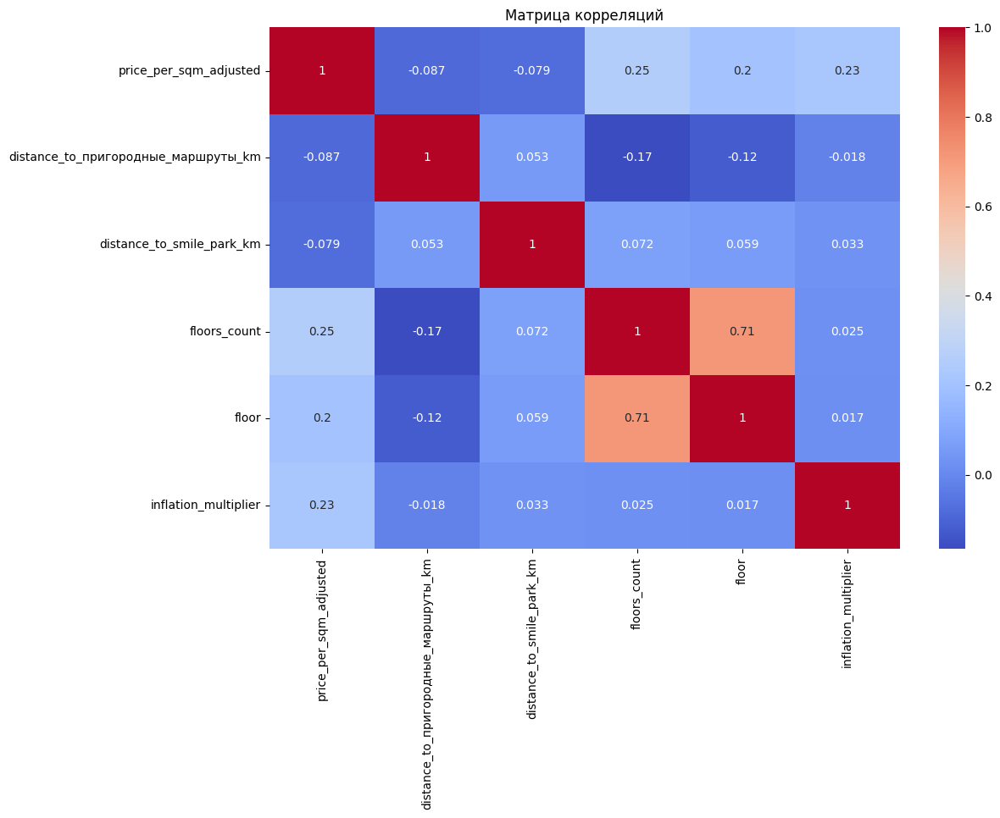

In [14]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
geo_features = merged[['latitude', 'longitude', 'price_per_sqm_adjusted']]
geo_scaled = scaler.fit_transform(geo_features)
kmeans = KMeans(n_clusters=5, random_state=42).fit(geo_scaled)
merged['cluster'] = kmeans.labels_

In [15]:
merged

,price,longitude,floor,floors_count,date,latitude,rooms_count,total_meters,price_per_sqm,distance_to_пригородные_маршруты_km,...,distance_to_лазаревское_взморье_km,distance_to_дом_отдыха_солнечный_km,Yearly rate (%),New mortgages,New mortgage amount (millions),inflation_multiplier,price_inflation_adjusted,price_per_sqm_adjusted,log_price_per_sqm,cluster
0,2500000,39.727167,2.0,8.0,2018-04-04,43.634694,-1.0,25.00,100000.000000,4.580712,...,43.372691,43.745098,10.0,2452,4624.0,1.008333,2.479339e+06,99173.553719,4.996396,0
1,3445000,40.003363,5.0,12.0,2018-08-14,43.403842,1.0,34.00,101323.529412,30.591525,...,77.268214,10.428635,10.0,2452,4624.0,1.008333,3.416529e+06,100486.144871,5.002106,1
2,7500000,39.698437,1.0,9.0,2018-08-29,43.626335,2.0,76.00,98684.210526,4.385410,...,42.393357,44.840056,10.0,2452,4624.0,1.008333,7.438017e+06,97868.638538,4.990644,0
3,4700000,39.748878,11.0,16.0,2018-09-03,43.623027,1.0,48.00,97916.666667,3.664239,...,45.534174,41.585438,10.0,2452,4624.0,1.008333,4.661157e+06,97107.438017,4.987252,0
4,3200000,39.721317,1.0,5.0,2018-09-05,43.628639,1.0,36.00,88888.888889,3.950145,...,43.501419,43.630736,10.0,2452,4624.0,1.008333,3.173554e+06,88154.269972,4.945243,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55552,9500000,39.765264,13.0,19.0,2025-03-09,43.572455,1.0,18.10,524861.878453,3.766508,...,50.443935,36.869945,7.8,1255,4755.0,1.617561,5.873041e+06,324477.379293,5.511184,2
55553,16500000,39.700617,6.0,9.0,2025-03-09,43.625384,3.0,86.45,190861.769809,4.201062,...,42.590845,44.638059,7.8,1255,4755.0,1.617561,1.020054e+07,117993.570151,5.071858,0
55554,4950000,39.908763,4.0,5.0,2025-03-09,43.454489,1.0,12.00,412500.000000,21.210500,...,67.929809,19.831331,7.8,1255,4755.0,1.617561,3.060163e+06,255013.603489,5.406563,2
55555,18500000,39.899575,5.0,8.0,2025-03-09,43.462418,-1.0,22.00,840909.090909,20.060193,...,66.778944,20.922653,7.8,1255,4755.0,1.617561,1.143697e+07,519862.442375,5.715888,2


In [16]:
merged.to_csv('../data/main_data.csv')

## Обучение модели

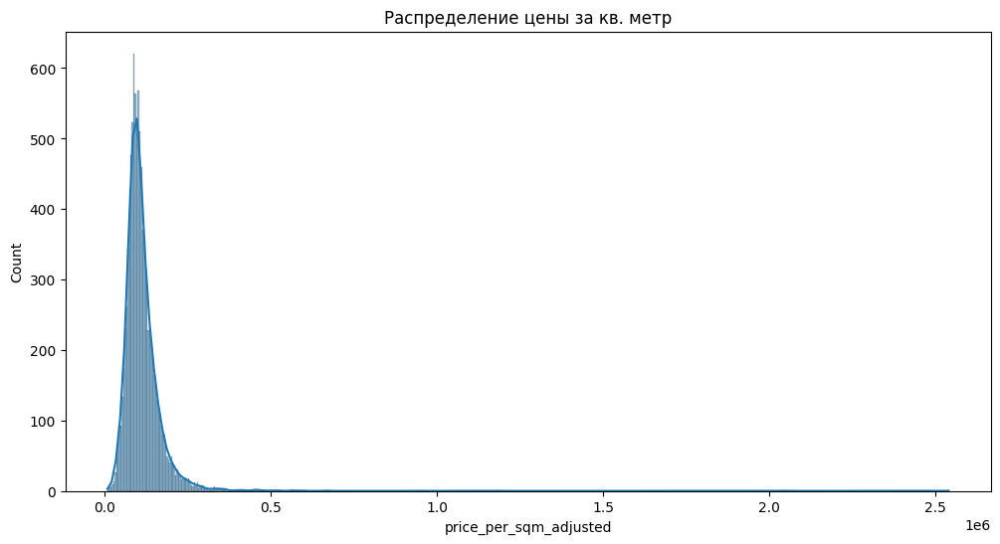

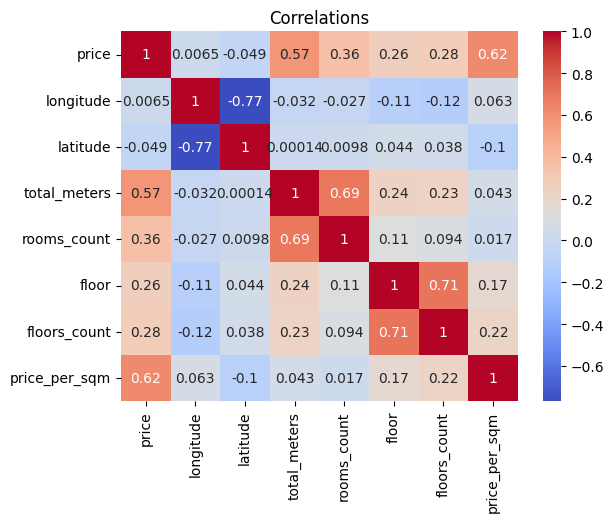

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns


plt.figure(figsize=(12, 6))
sns.histplot(df['price_per_sqm_adjusted'], kde=True)
plt.title('Распределение цены за кв. метр')
plt.show()

corr_matrix = df[['price', 'longitude', 'latitude', 'total_meters', 'rooms_count', 
                  'floor', 'floors_count', 'price_per_sqm']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlations')
plt.show()